In [2]:
import sympy as sp
import numpy as np
import matplotlib.pyplot as plt
from sympy.utilities import lambdify
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

sp.init_printing()

In [3]:
x = sp.Symbol('x', real = True)
k = sp.Symbol('k', real = True, positive = True)
a = sp.Symbol('a', real = True)
n = sp.Symbol('n', integer = True, nonzero = True)
m = sp.Symbol('m', real = True, positive = True)
h = sp.Symbol('hbar', real = True, positive = True)
psi = sp.Function('\psi')
t = sp.Symbol('t', real = True)

x, k, a, psi(x), n, m , h, t

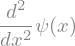

In [4]:
psi(x).diff(x, x)

In [5]:
-k**2 * psi(x)

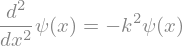

In [6]:
eq = sp.Eq(psi(x).diff(x, x), -k**2 * psi(x))
eq

In [7]:
sol = sp.dsolve(eq, psi(x), ics = {psi(0) : 0, psi(a) : 0})
sol

In [8]:
sol = sp.dsolve(eq, psi(x), ics = {psi(0) : 0})
sol

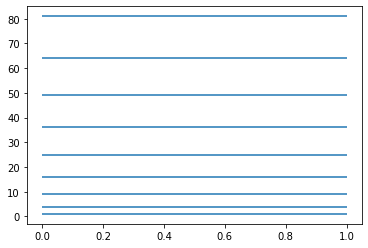

In [9]:
plt.hlines(np.arange(1, 10)**2, 0, 1)

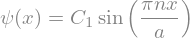

In [10]:
sol = sol.subs(k, n * sp.pi / a)
sol

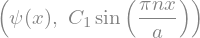

In [11]:
sol.lhs, sol.rhs

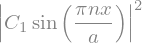

In [12]:
sp.Abs(sol.rhs)**2

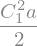

In [13]:
sp.integrate((sol.rhs)**2, (x, 0, a))

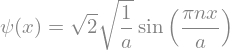

In [14]:
sol = sol.subs(sp.Symbol('C1'), sp.sqrt(2 / a))
sol

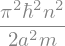

In [15]:
n**2 * sp.pi**2 * h**2 / (2 * m * a**2)

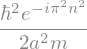

In [16]:
sp.exp(-sp.I * n**2 * sp.pi**2) * h**2 / (2 * m * a**2)

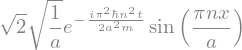

In [17]:
Psi = sol.rhs * sp.exp(-sp.I * n**2 * sp.pi**2 * h**2 / (2 * m * a**2) * t / h)
Psi

In [18]:
Psif = lambdify((x, t, n), Psi.subs({h : 1, m : 1, a : 1}))
Psif(0.3, 2.3, 1)

(0.3971182633717983+1.0729930471683005j)

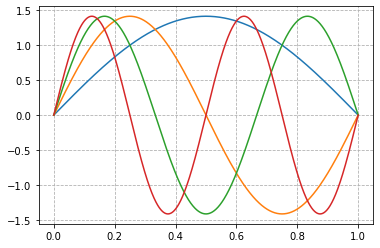

In [19]:
xs = np.linspace(0, 1, 1000)
#ys = Psif(xs, 0, 1).real

#plt.plot(xs, ys)
plt.grid(linestyle= '--')

#ys = Psif(xs, 0, 2).real
#plt.plot(xs, ys)

#ys = Psif(xs, 0, 3).real
#plt.plot(xs, ys)

for i in range (1, 4+1):
    ys = Psif(xs, 0, i).real
    plt.plot(xs, ys)


In [20]:
n = 3

xs = np.linspace(0, 1, 1000)

fig = plt.figure()
fig.patch.set_facecolor('xkcd:white')


plt.xlim(0, 1)
plt.ylim(-1.5, 1.5)

plot1, = plt.plot([], [])
plot2, = plt.plot([], [])

plt.close()

dt = 0.001

def frame(i):
    t = i * dt
    ys = Psif(xs, t, n)
    ys1 = ys.real
    ys2 = ys.imag

    plot1.set_data(xs, ys1)
    plot2.set_data(xs, ys2)

    return plot1, plot2

anim = FuncAnimation(fig, frame, 300, interval = 20, blit = True)
HTML(anim.to_jshtml())

In [21]:
n = 1

xs = np.linspace(0, 1, 1000)

fig = plt.figure()
fig.patch.set_facecolor('xkcd:white')


plt.xlim(0, 1)
plt.ylim(0, 3)

plot1, = plt.plot([], [])

plt.close()

dt = 0.001

def frame(i):
    t = i * dt
    ys = Psif(xs, t, n)
    ys1 = np.abs(ys)**2

    plot1.set_data(xs, ys1)

    return plot1,

anim = FuncAnimation(fig, frame, 300, interval = 20, blit = True)
HTML(anim.to_jshtml())

In [22]:
xs = np.linspace(0, 1, 1000)

fig = plt.figure()
fig.patch.set_facecolor('xkcd:white')

plt.xlim(0, 1)
plt.ylim(0, 5)

plot1, = plt.plot([], [])

plt.close()

dt = 0.003

def frame(i):
    t = i * dt
    ys = (Psif(xs, t, 1) + Psif(xs, t, 2) + Psif(xs, t, 3)) / np.sqrt(3)
    ys1 = np.abs(ys)**2

    plot1.set_data(xs, ys1)

    return plot1,

anim = FuncAnimation(fig, frame, 300, interval = 20, blit = True)
HTML(anim.to_jshtml())

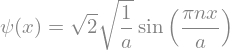

In [23]:
sol

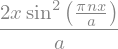

In [24]:
sol.rhs * x * sol.rhs

$<x>$:

In [37]:
e_x = sp.integrate(sol.rhs * x * sol.rhs, (x, 0, a))
e_x

$<x^2>$:

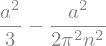

In [38]:
e_x2 = sp.integrate(sol.rhs * x**2 * sol.rhs, (x, 0, a)).simplify()
e_x2

Policzyć:
średni pęd, $$<p> = ?$$
średni kwadrat pędu, $$<p^2> = ?$$
dodatkowo: Czy zasada nieoznaczoności jest faktycznie spełniona?

==========================================================================================

Ponieważ funkcja $\psi(x)$ jest znormalizowana, to:

$$<Q> = \int_{-\infty}^{\infty} \psi(x)^{*} (\hat{Q}) \psi(x) dx$$

gdzie Q jest dowolną mierzoną wartością.

Dla $p$:

$$\hat{p} = \frac{\hbar}{i} \frac{d}{dx}$$

Co daje wartość oczekiwaną:

$$<p> = \frac{\hbar}{i} \int_{-\infty}^{\infty} \psi(x)^* \frac{d\psi(x)}{dx} dx$$

W rozważanym przypadku uproszczone do:

$$<p> = \frac{\hbar}{i} \int_{0}^{a} \psi(x) \frac{d\psi(x)}{dx} dx$$

In [40]:
e_p = (h / sp.I * sp.integrate(sol.rhs * sp.diff(sol.rhs, x), (x, 0, a))).simplify()
e_p

Dla $p^2$ natomiast starczy podstawić operator $\hat{p}$:

$$\hat{p^2} = \hat{p} \hat{p} = \frac{\hbar^2}{i^2} \frac{d}{dx}(\frac{d}{dx}) = -\hbar^2 \frac{d^2}{dx^2}$$

Wartość oczekiwana to zatem:

$$<p^2> = -\hbar^2 \int_{-\infty}^{\infty} \psi(x)^* \frac{d^{2}\psi(x)}{dx^2} dx$$

Uproszczona:

$$<p^2> = -\hbar^2 \int_{0}^{a} \psi(x) \frac{d^{2}\psi(x)}{dx^2} dx$$

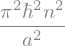

In [39]:
e_p2 = (-h**2 * sp.integrate(sol.rhs * sp.diff(sol.rhs, x, 2), (x, 0, a))).simplify()
e_p2

Zasada nieoznaczoności dla położenia i pędu to:

$$\sigma_x \cdot \sigma_p \geq \hbar$$

Gdzie:

$$\sigma_x = \sqrt{<x^2> - <x>^2}$$
$$\sigma_p = \sqrt{<p^2> - <p>^2}$$

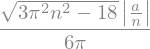

In [44]:
odch_x = sp.sqrt(e_x2 - e_x**2).simplify()
odch_x

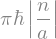

In [45]:
odch_p = sp.sqrt(e_p2 - e_p**2).simplify()
odch_p

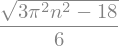

In [64]:
nierown = (odch_x * odch_p / h).simplify()
nierown

Po podstawieniu wartości do nierówności i podzieleniu przez $\hbar$ otrzymujemy:

$$\frac{\sqrt{3\pi^{2}n^{2} - 18}}{6} \geq 0$$

Przekształcając:

In [66]:
nierown1 = ((nierown * 6)**2).simplify()
nierown1

Rozwiązując to już ręcznie:

$$3\pi^{2}n^2 \geq 18$$
$$n^2 \geq \frac{6}{\pi^2}$$

Uwzględniając, że $n \in \mathbb{N}$:

$$n \geq \frac{6}{\pi^2} \approx 0.6079...$$

Warunek ten jest spełniony dla $\forall n \in \mathbb{N}$, zatem nierówność i konsekwentnie, zasadna nieoznaczoności jest zawsze spełniona.$_{\square}$